In [1]:
from IPython.display import Markdown
import os

dataset_name = os.environ.get("DATASET")
display(Markdown(f"# Raport EDA: Zbiór **{dataset_name}**"))

# Raport EDA: Zbiór **sephora**

*Author: Szymon Stano*

The purpose of this report is to conduct a basic exploratory data analysis of the dataset, as a preliminary step for training a sentiment analysis model.

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
import yaml

sns.set_theme()

In [3]:
with open("/app/params.yaml") as f:
    params = yaml.safe_load(f)
dataset_name = os.environ.get("DATASET")


input_path = f"/app/data/train_test/{dataset_name}_train_data.csv"
df = pd.read_csv(input_path, engine="python")

dataset_cfg = params["datasets"][dataset_name]
class_column = dataset_cfg["label_column"]

## 1. Basic Data Analysis

In [4]:
df.shape

(8000, 36)

Text(0.5, 1.0, 'Rozkład klas')

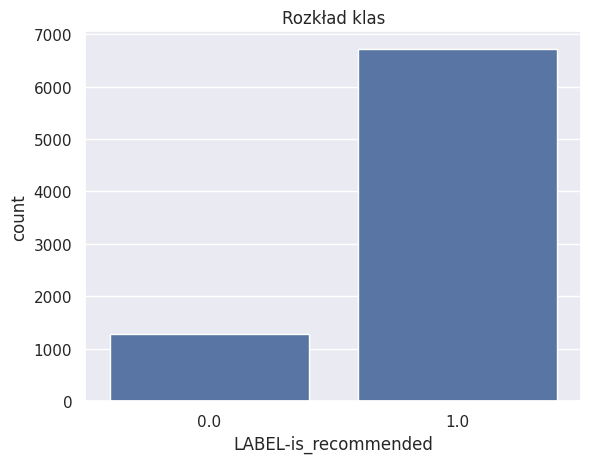

In [5]:
sns.countplot(x=df[class_column])
plt.title("Rozkład klas")

Below are example samples from the dataset.

In [6]:
pd.set_option("display.max_columns", None)
df.sample(3)

,helpfulness,total_feedback_count,total_neg_feedback_count,total_pos_feedback_count,review_text,review_title,skin_tone,eye_color,skin_type,hair_color,product_id,price_usd,brand_id,loves_count,rating,reviews,size,variation_type,variation_value,variation_desc,ingredients,value_price_usd,sale_price_usd,limited_edition,new,online_only,out_of_stock,sephora_exclusive,highlights,primary_category,secondary_category,tertiary_category,child_count,child_max_price,child_min_price,LABEL-is_recommended
7310,NaN,0,0.0,0,I received this product free from Influenster ...,NaN,lightMedium,brown,combination,brown,P439061,35.0,5674.0,182201.0,4.1922,2955.0,6.5 oz/ 190 mL,Size,6.5 oz/ 190 mL,NaN,"['Water, Glycolic Acid, Hamamelis Virginiana (...",NaN,NaN,0.0,0.0,0.0,0.0,1.0,"['Vegan', 'Good for: Dullness/Uneven Texture',...",Skincare,Cleansers,Toners,1.0,19.0,19.0,1.0
4641,0.500000,4,2.0,2,This doesn’t sink in well to the skin--it sits...,"Thick, non-absorbent formula",fair,hazel,combination,NaN,P480177,60.0,6218.0,22539.0,4.5714,581.0,0.5 oz/ 15 mL,Size,0.5 oz/ 15 mL,NaN,"['Aqua / Water, Dimethicone, Glycerin, Hydroxy...",NaN,NaN,0.0,0.0,0.0,0.0,0.0,"['Good for: Loss of firmness', 'Clean at Sepho...",Skincare,Eye Care,Eye Creams & Treatments,0.0,NaN,NaN,0.0
1237,0.166667,12,10.0,2,I was using the Ultra Repair Firmiing Collagen...,Not working for me.,fair,green,combination,blonde,P455894,36.0,5972.0,24055.0,4.2388,289.0,1.7 oz/ 50 mL,Size,1.7 oz/ 50 mL,NaN,"['Aqua (Water, Eau), Dimethicone, Propanediol,...",NaN,NaN,0.0,0.0,0.0,0.0,0.0,"['Best for Oily, Combo, Normal Skin', 'Good fo...",Skincare,Moisturizers,Moisturizers,0.0,NaN,NaN,1.0


As part of the analysis of feature types and their approximate distributions, a report was generated using the `ydata-profiling` library. It presents basic statistics for each feature in the data.

In [7]:
profile = ProfileReport(df, title="Raport Profilowania", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


  0%|                                                                                                                    | 0/36 [00:00<?, ?it/s]


  6%|██████                                                                                                      | 2/36 [00:00<00:01, 17.30it/s]


 14%|███████████████                                                                                             | 5/36 [00:01<00:08,  3.66it/s]


 58%|██████████████████████████████████████████████████████████████▍                                            | 21/36 [00:01<00:00, 15.08it/s]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:01<00:00, 21.52it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Missing Data Plot
Below is a chart showing the proportion of missing values for each feature.

Text(0.5, 1.0, 'Proporcja brakujących danych')

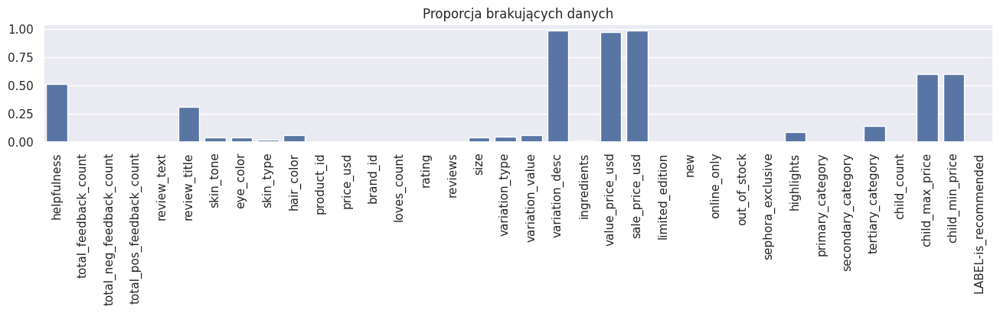

In [8]:
plt.figure(figsize=(16, 2))
plt.xticks(rotation=90)
sns.barplot(df.isnull().sum() / len(df))
plt.title("Proporcja brakujących danych")

#### Correlation Matrix

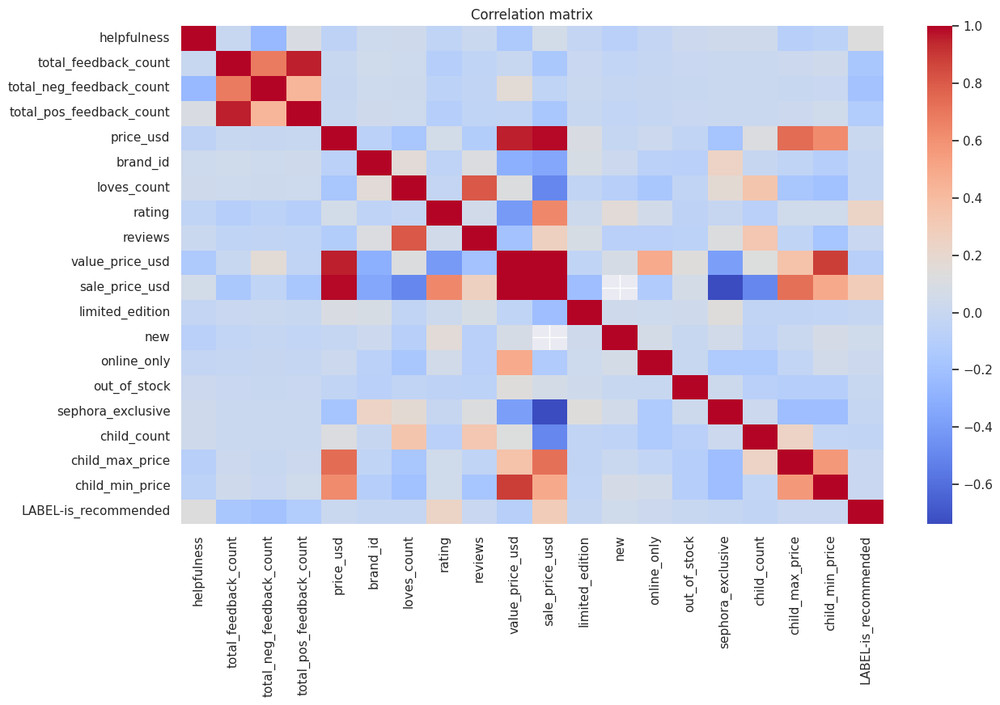

In [9]:
df_all_numeric = df.select_dtypes(include=["int64", "float64"])
correlation_matrix = df_all_numeric.corr()

plt.figure(figsize=(14, 8))
sns.heatmap(correlation_matrix, cmap="coolwarm", fmt=".2f")

plt.title("Correlation matrix")
plt.show()